In [30]:
#Import modules
import pandas as pd
import numpy as np
import time
import datetime
import math
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline
import os
os.getcwd()

'/Users/kioshi/Desktop/Python/Projects'

In [31]:
os.listdir(os.getcwd())

['.DS_Store',
 'Analyzing Earthquakes in the U.S. (1970-2014).ipynb',
 'newplot (1).png',
 'newplot (2).png',
 '.ipynb',
 'earthquake_states.csv',
 'newplot (3).png',
 '.ipynb_checkpoints',
 'Analyzing Earthquakes in the U.S. (1970-2014)-Copy1.ipynb']

In [32]:
#Import data using absolute path: earthquake_states.csv & set 'time' column to index
every_earthquake = pd.read_csv('earthquake_states.csv', index_col='time')
every_earthquake.sort_index(inplace=True, ascending=True) 

#Convert 'time' column to datetime format
every_earthquake['time'] = pd.to_datetime(every_earthquake.index, utc=True, 
                                          infer_datetime_format=True)
print(every_earthquake.head(10))
print(every_earthquake.shape)


                        latitude  longitude  mag            id  \
time                                                             
1970-01-07 07:56:14-05    15.785    -59.808  6.0  iscgem799824   
1970-01-16 08:05:41-05    60.250   -152.734  5.6  iscgem800129   
1970-02-04 05:08:48-05    15.518    -99.576  6.4  iscgem798802   
1970-02-24 08:05:45-05    59.510   -143.636  5.8  iscgem799398   
1970-03-11 22:38:36-05    57.399   -154.058  6.0  iscgem797882   
1970-04-09 16:24:28-05    13.067    -92.371  5.8  iscgem796529   
1970-04-11 04:05:45-05    59.610   -142.594  6.1  iscgem796590   
1970-04-16 05:33:21-05    59.702   -142.683  6.7  iscgem796787   
1970-04-18 08:50:41-05    59.804   -152.780  5.6  iscgem796868   
1970-04-19 01:15:48-05    59.571   -142.807  5.9  iscgem796899   

                                           updated  \
time                                                 
1970-01-07 07:56:14-05  2015-02-12 15:12:32.099-05   
1970-01-16 08:05:41-05  2015-02-12 16:03:22.4

In [33]:
#Select subset of states, magnititudes, coordinates of earthquakes and remove NaN values: fifty_state_quakes
fifty_state_quakes = every_earthquake[['state', 'latitude', 'longitude', 'mag']].dropna()
   
#Retrieve frequency count for state earthquakes: state_quakes
fifty_state_quakes_freq = pd.crosstab(fifty_state_quakes.state,
                                      fifty_state_quakes.mag).replace(0,np.nan).\
     stack().reset_index().rename(columns={0:'Occurrences'})



print(fifty_state_quakes_freq)

       state  mag  Occurrences
0    Alabama  3.0         10.0
1    Alabama  3.1          3.0
2    Alabama  3.2          2.0
3    Alabama  3.3          4.0
4    Alabama  3.4          3.0
..       ...  ...          ...
773  Wyoming  5.1          2.0
774  Wyoming  5.3          3.0
775  Wyoming  5.5          1.0
776  Wyoming  5.8          2.0
777  Wyoming  5.9          1.0

[778 rows x 3 columns]


In [34]:
#Find mean of magnititudes for all states
fifty_state_quakes['mag'].mean()

3.476415000000232

In [35]:
#Determine  earthquake occurrence for all states
fifty_state_quakes.drop(columns=['latitude', 'longitude']).groupby(['state']).count()

,mag
state,
Alabama,35
Alaska,12326
Arizona,174
Arkansas,147
California,18108
Colorado,143
Connecticut,5
Florida,1
Georgia,14


In [36]:
#Separate West and East States and join them side by side: West_q & East_q
West_quakes = pd.DataFrame({'state':  ['California', 'Oregon', 'Washington', 'Alaska'], 
                    'Occurrences':  [18108, 376, 973, 12326]})
East_quakes = pd.DataFrame({'state': ['Maine', 'New Hampshire', 'Massachusetts',  
                        'Connecticut', 'New York', 'New Jersey', 'Pennsylvania',  'Maryland', 
                        'Virginia', 'North Carolina', 'South Carolina', 'Georgia', 'Florida'],
                        'Occurrences': [36, 13, 10, 5, 35, 10, 14, 2, 28, 17, 32, 14, 1]})

pd.concat((West_quakes, East_quakes), axis=1, keys=('West','East')).fillna(0)

West                        East            
         state Occurrences           state Occurrences
0   California     18108.0           Maine          36
1       Oregon       376.0   New Hampshire          13
2   Washington       973.0   Massachusetts          10
3       Alaska     12326.0     Connecticut           5
4            0         0.0        New York          35
5            0         0.0      New Jersey          10
6            0         0.0    Pennsylvania          14
7            0         0.0        Maryland           2
8            0         0.0        Virginia          28
9            0         0.0  North Carolina          17
10           0         0.0  South Carolina          32
11           0         0.0         Georgia          14
12           0         0.0         Florida           1

In [37]:
#Retrieve highest magnitude for a given state: state_mag
state_mag = pd.DataFrame(fifty_state_quakes, columns=['state', 
                        'latitude', 'longitude', 'mag']).dropna()
#Retrieve max of magnitude for state
state_max_mag = state_mag.groupby(['state', 'latitude', 
                            'longitude'])['mag'].max().reset_index()
print(state_max_mag)

         state  latitude  longitude  mag
0      Alabama    31.100    -87.300  3.7
1      Alabama    31.115    -87.520  3.3
2      Alabama    31.118    -87.339  4.8
3      Alabama    31.346    -87.467  3.0
4      Alabama    31.607    -87.808  3.0
...        ...       ...        ...  ...
33187  Wyoming    44.897   -110.888  3.0
33188  Wyoming    44.902   -110.960  3.5
33189  Wyoming    44.924   -110.653  4.2
33190  Wyoming    44.932   -106.062  3.9
33191  Wyoming    44.935   -110.316  3.3

[33192 rows x 4 columns]


In [54]:
#Plot Geomap of earthquake magnitudes for all states
state_max_mag['text'] = state_max_mag['state'] + '<br>Magnitude ' + (state_max_mag['mag']).astype(str)
magnitude =  [(0,1), (1,3), (3,5), (5,6), (6,8), (8, 10)]
colors =  ['orange','lightgrey','lightseagreen','royalblue',
           'crimson', 'magenta']
scale = 1.4

fig = go.Figure()

for i in range(len(magnitude)):

    magn = magnitude[i]

    state_max_mag_df = state_max_mag[(state_max_mag['mag'] >= magn[0]) & (state_max_mag['mag'] < magn[1])]

    fig.add_trace(go.Scattergeo(
    locationmode = 'USA-states',
    lon = state_max_mag_df['longitude'],
    lat = state_max_mag_df['latitude'],
    text = state_max_mag_df['text'],
    marker = dict(
        size = state_max_mag_df['mag'] * scale,
        color = colors[i],
        line_color = 'rgb(40,40,40)',
        line_width = 0.5,
        sizemode = 'diameter'),
    name = '{0} - {1}'.format(magn[0], magn[1])))

fig.update_layout(
    title_text = '1970 - 2014 US earthquakes<br>(Click legend to toggle traces/magnitudes)',
  showlegend = True,
  geo = dict(scope = 'usa', landcolor = 'rgb(217, 217, 217)')
)

fig.show()

In [55]:
yr_01_14 = every_earthquake.loc['2004-01-01':'2014-12-31'].drop(columns=['latitude', 'longitude'])
yr_01_14['month_year'] = yr_01_14['time'].dt.strftime('%B-%Y')
yr_01_14_occur = yr_01_14.groupby(['month_year', 'mag'])['time'].count().reset_index(name='occurrence')
#yr_01_14_occur_mon = yr_01_14_occur.groupby('month_year').agg({'occurrence': ['count']})

pd.set_option('display.max_rows', yr_01_14_occur.shape[0]+1)
print(yr_01_14_occur['month_year'].value_counts())

November-2014     82
December-2014     62
October-2014      56
July-2014         49
September-2014    49
August-2014       48
March-2014        46
May-2014          43
April-2014        40
December-2013     39
June-2014         34
February-2014     33
January-2014      33
January-2010      32
October-2012      32
January-2008      30
November-2009     30
May-2009          30
April-2010        29
November-2012     29
December-2007     29
January-2013      29
September-2013    29
November-2004     29
August-2012       29
November-2011     29
October-2009      28
December-2004     28
July-2009         28
March-2012        28
October-2007      28
April-2011        28
May-2010          28
January-2004      28
April-2008        28
March-2009        27
January-2007      27
August-2009       27
November-2008     27
February-2004     27
July-2008         27
June-2004         27
October-2013      27
September-2011    27
November-2007     27
July-2007         27
July-2011         27
May-2011     

In [56]:
#To determine popular months, lets count 'month' only
yr_01_14['month'] = yr_01_14['time'].dt.strftime('%B')
month_01_14_occur = yr_01_14.groupby(['month', 'mag'])['time'].count().reset_index(name='occurrence')
print(month_01_14_occur['month'].value_counts())

November     97
December     82
October      73
September    61
August       60
July         58
March        52
January      48
May          48
April        47
June         47
February     46
Name: month, dtype: int64


In [57]:
#Sort 'time'column by months October, November, and December
oct_quakes = every_earthquake[every_earthquake['time'].dt.month == 10]
nov_quakes = every_earthquake[every_earthquake['time'].dt.month == 11]
dec_quakes = every_earthquake[every_earthquake['time'].dt.month == 12]

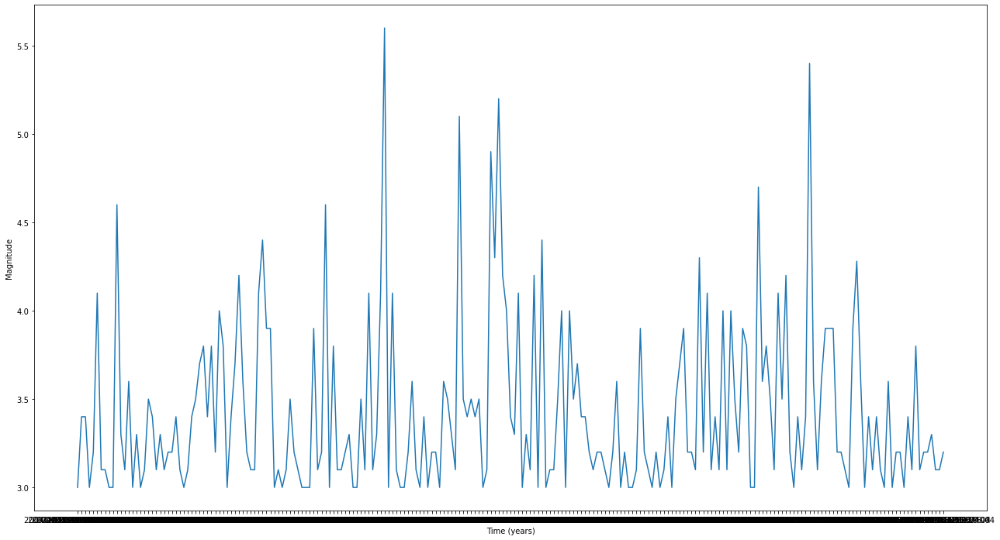

In [58]:
#Set 'state' to index
oct_quakes.set_index('state')

#Select June dates in the last decade for California and plot
oct_quakes_decade = oct_quakes.loc['2004-06-01':'2014-06-30']


ca_oct_quakes = oct_quakes_decade[oct_quakes_decade
                                    ['state'] == 'California']

fig = plt.figure()
fig.set_size_inches(22, 12)
plt.plot(ca_oct_quakes['mag'])
plt.xlabel('Time (years)')
plt.ylabel('Magnitude');

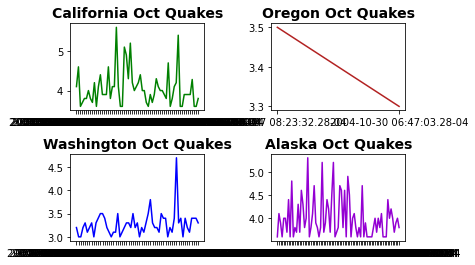

In [59]:
#No visible trend can be seen in above plot so let's set 'mag' above (3.5) for California along with Oregon, Washington, and Alaska
ca_oct_quakes_above_three = ca_oct_quakes[ca_oct_quakes['mag'] 
                                            > 3.5]

#Set state to 'Oregon', 'Washington', and 'Alaska', set appropriate 'mag' and plot June months for 2004 - 2014 side by side
or_oct_quakes_above_three = oct_quakes_decade[(
    oct_quakes_decade['state'] == 'Oregon') & 
    (oct_quakes_decade['mag'] > 3.0)]

wa_oct_quakes_above_three = oct_quakes_decade[(
    oct_quakes_decade['state'] == 'Washington') & 
    (oct_quakes_decade['mag'] > 2.5)]

ak_oct_quakes_above_three = oct_quakes_decade[(
    oct_quakes_decade['state'] == 'Alaska') & 
    (oct_quakes_decade['mag'] > 3.5)]

#Plot comparison graph
fig, ax = plt.subplots(2,2)
ax[0,0].plot(ca_oct_quakes_above_three['mag'], color='green')
ax[0,0].set_title('California Oct Quakes', fontweight='bold', fontsize='14')
ax[0,1].plot(or_oct_quakes_above_three['mag'], color='firebrick')
ax[0,1].set_title('Oregon Oct Quakes', fontweight='bold', fontsize=14)
ax[1,0].plot(wa_oct_quakes_above_three['mag'], color='blue')
ax[1,0].set_title('Washington Oct Quakes', fontweight='bold', fontsize='14')
ax[1,1].plot(ak_oct_quakes_above_three['mag'], color='darkviolet')
ax[1,1].set_title('Alaska Oct Quakes', fontweight='bold', fontsize=14)
fig.subplots_adjust(wspace=0.5, hspace=0.5);

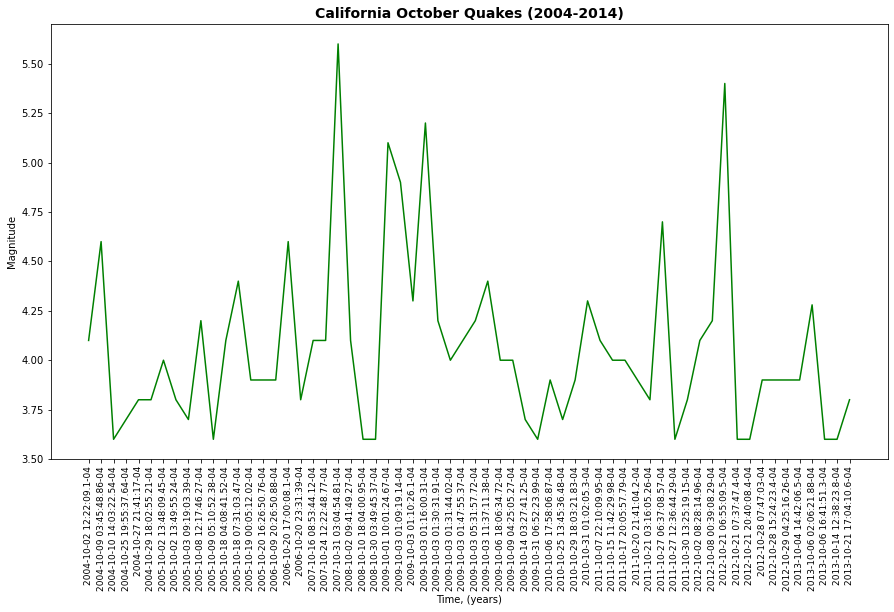

In [60]:
#California and Alaska seem to have the most activity, so lets take a closer look at those two

#Plot California June Quakes
fig = plt.figure()
fig.set_size_inches(15, 8)
plt.plot(ca_oct_quakes_above_three['mag'], color='green')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=9, rotation=90)
plt.title('California October Quakes (2004-2014)', fontsize=14, fontweight='bold');

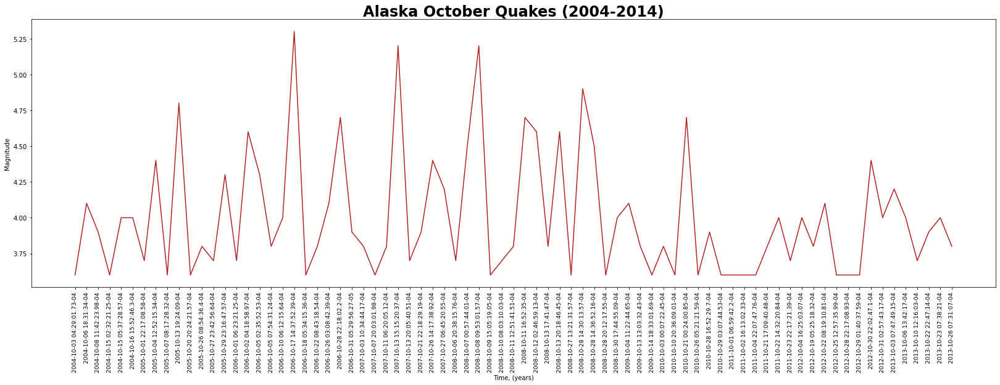

In [61]:
# Plot Alaska quakes for the last decade using 3.0 or higher for magnitude
fig = plt.figure()
fig.set_size_inches(28, 8)
plt.plot(ak_oct_quakes_above_three['mag'], color='firebrick')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=9.5, rotation=90)
plt.title('Alaska October Quakes (2004-2014)', fontsize=24, fontweight='bold');

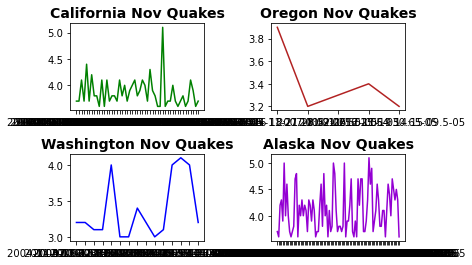

In [62]:
#Set 'state' as index for July months
nov_quakes.set_index('state')

#Select June dates in the last decade for California, Oregon, Washington, Alaska and plot
nov_quakes_decade = nov_quakes.loc['2004-07-01':'2014-07-31']

ca_nov_quakes_above_three = nov_quakes_decade[(
    nov_quakes_decade['state'] == 'California') & 
    (nov_quakes_decade['mag'] > 3.5)]

or_nov_quakes_above_three = nov_quakes_decade[(
    nov_quakes_decade['state'] == 'Oregon') & 
    (nov_quakes_decade['mag'] > 3.0)]

wa_nov_quakes_above_three = nov_quakes_decade[(
    nov_quakes_decade['state'] == 'Washington') & 
    (nov_quakes_decade['mag'] > 2.5)]

ak_nov_quakes_above_three = nov_quakes_decade[(
    nov_quakes_decade['state'] == 'Alaska') & 
    (nov_quakes_decade['mag'] > 3.5)]

#Plot comparison graph
fig, ax = plt.subplots(2,2)
ax[0,0].plot(ca_nov_quakes_above_three['mag'], color='green')
ax[0,0].set_title('California Nov Quakes', fontweight='bold', fontsize=14)
ax[0,1].plot(or_nov_quakes_above_three['mag'], color='firebrick')
ax[0,1].set_title('Oregon Nov Quakes', fontweight='bold', fontsize=14)
ax[1,0].plot(wa_nov_quakes_above_three['mag'], color='blue')
ax[1,0].set_title('Washington Nov Quakes', fontweight='bold', fontsize=14)
ax[1,1].plot(ak_nov_quakes_above_three['mag'], color='darkviolet')
ax[1,1].set_title('Alaska Nov Quakes', fontweight='bold', fontsize=14)
fig.subplots_adjust(wspace=0.5, hspace=0.5);

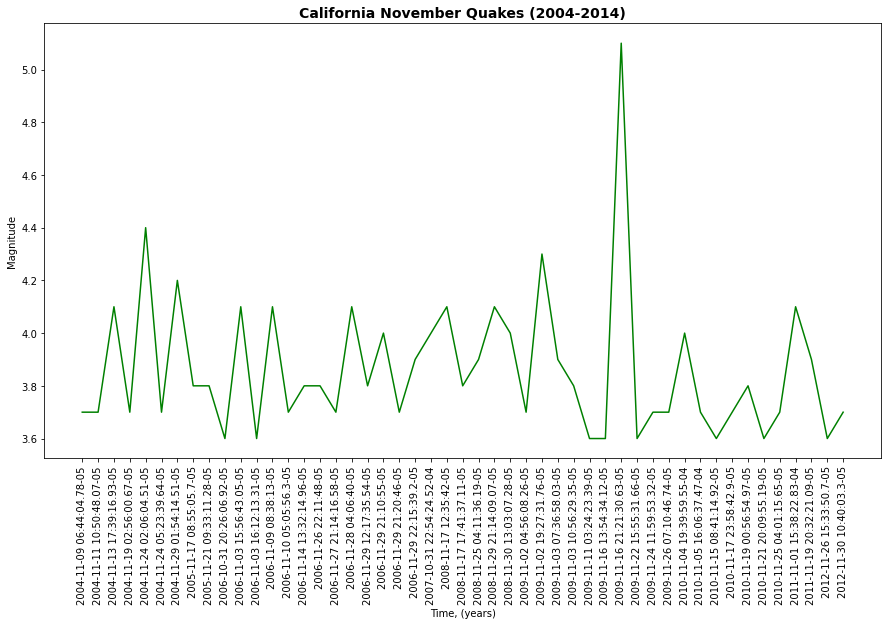

In [63]:
#July has California, Washington, and Alaska with lots of activity, lets take a closer look at these
#Plot California July Quakes
fig = plt.figure()
fig.set_size_inches(15, 8)
plt.plot(ca_nov_quakes_above_three['mag'], color='green')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=10, rotation=90)
plt.title('California November Quakes (2004-2014)', fontweight='bold', fontsize=14);

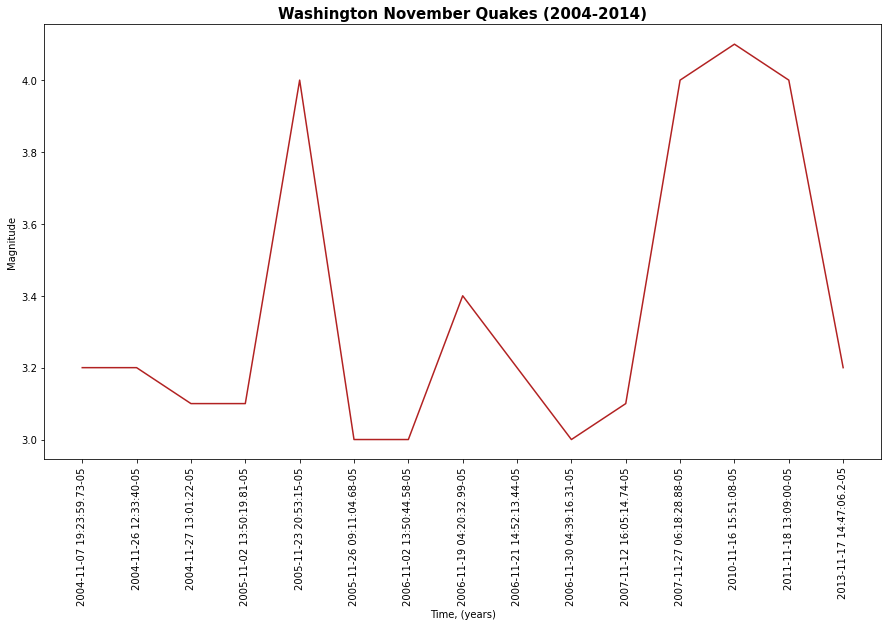

In [64]:
# Plot Washington quakes for the last decade using 3.0 or higher for magnitude
fig = plt.figure()
fig.set_size_inches(15, 8)
plt.plot(wa_nov_quakes_above_three['mag'], color='firebrick')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=10, rotation=90)
plt.title('Washington November Quakes (2004-2014)', fontweight='bold', fontsize=15);

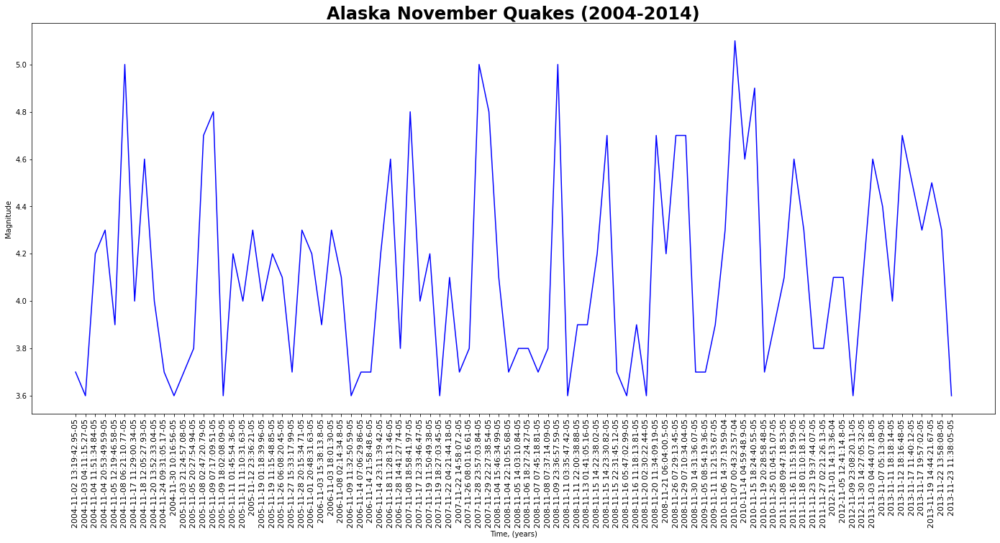

In [65]:
# Plot Alaska quakes for the last decade using 3.0 or higher for magnitude
fig = plt.figure()
fig.set_size_inches(24, 10)
plt.plot(ak_nov_quakes_above_three['mag'], color='blue')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=11, rotation=90)
plt.title('Alaska November Quakes (2004-2014)', fontsize=24, fontweight='bold');

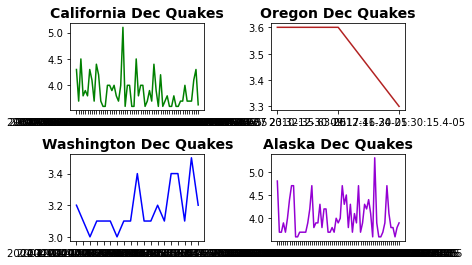

In [66]:
#Set 'state' as index for August months
dec_quakes.set_index('state')

#Select June dates in the last decade for California, Oregon, Washington, Alaska and plot
dec_quakes_decade = dec_quakes.loc['2004-08-01':'2014-08-31']

ca_dec_quakes_above_three = dec_quakes_decade[(
    dec_quakes_decade['state'] == 'California') & 
    (dec_quakes_decade['mag'] > 3.5)]

or_dec_quakes_above_three = dec_quakes_decade[(
    dec_quakes_decade['state'] == 'Oregon') & 
    (dec_quakes_decade['mag'] > 3.0)]

wa_dec_quakes_above_three = dec_quakes_decade[(
    dec_quakes_decade['state'] == 'Washington') & 
    (dec_quakes_decade['mag'] > 2.5)]

ak_dec_quakes_above_three = dec_quakes_decade[(
    dec_quakes_decade['state'] == 'Alaska') & 
    (dec_quakes_decade['mag'] > 3.5)]

#Plot comparison graph
fig, ax = plt.subplots(2,2)
ax[0,0].plot(ca_dec_quakes_above_three['mag'], color='green')
ax[0,0].set_title('California Dec Quakes', fontsize=14, fontweight='bold')
ax[0,1].plot(or_dec_quakes_above_three['mag'], color='firebrick')
ax[0,1].set_title('Oregon Dec Quakes', fontsize=14, fontweight='bold')
ax[1,0].plot(wa_dec_quakes_above_three['mag'], color='blue')
ax[1,0].set_title('Washington Dec Quakes', fontsize=14, fontweight='bold')
ax[1,1].plot(ak_dec_quakes_above_three['mag'], color='darkviolet')
ax[1,1].set_title('Alaska Dec Quakes', fontsize=14, fontweight='bold')

fig.subplots_adjust(wspace=0.5, hspace=0.5);

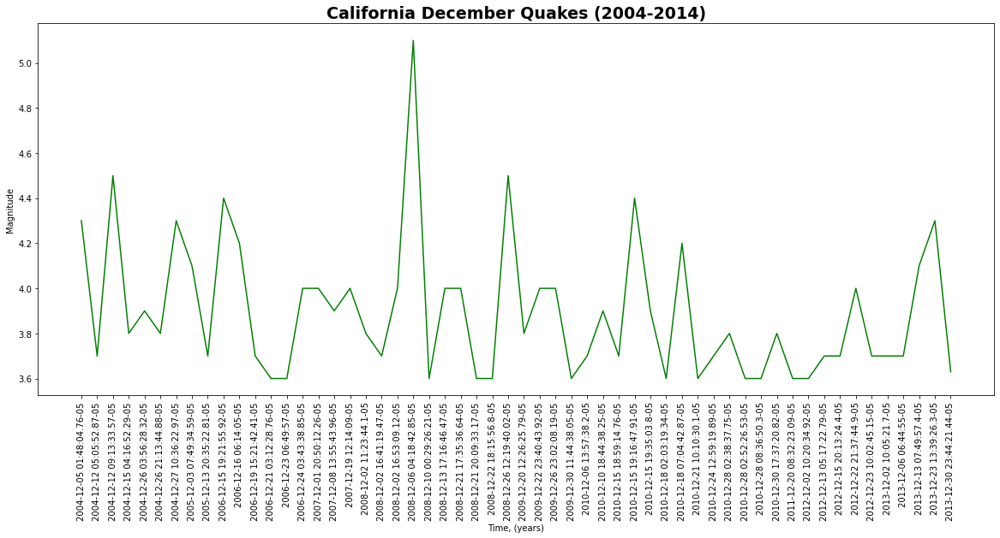

In [67]:
#August shows California and Alaska again having the most activity, so lets take a closer look at these
#Plot California August Quakes
fig = plt.figure()
fig.set_size_inches(20, 8)
plt.plot(ca_dec_quakes_above_three['mag'], color='green')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=10, rotation=90)
plt.title('California December Quakes (2004-2014)', fontsize=19, fontweight='bold');

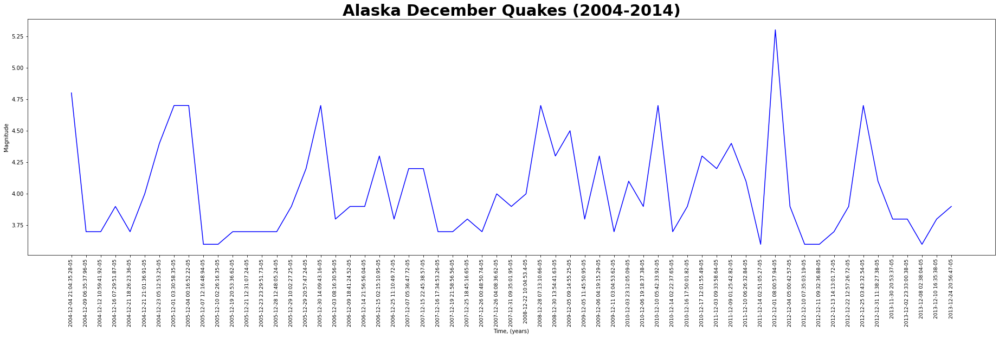

In [68]:
#Plot Alaska August Quakes
fig = plt.figure()
fig.set_size_inches(32, 8)
plt.plot(ak_dec_quakes_above_three['mag'], color='blue')
plt.xlabel('Time, (years)')
plt.ylabel('Magnitude')
plt.xticks(fontsize=9, rotation=90)
plt.title('Alaska December Quakes (2004-2014)', fontsize=29, fontweight='bold');